In [218]:
# importing libraries
import numpy as np
import numpy.matlib
import matplotlib.pyplot as plt
import matplotlib.style as ms
ms.use('seaborn-muted')
%matplotlib inline
import IPython.display
import librosa
import librosa.display

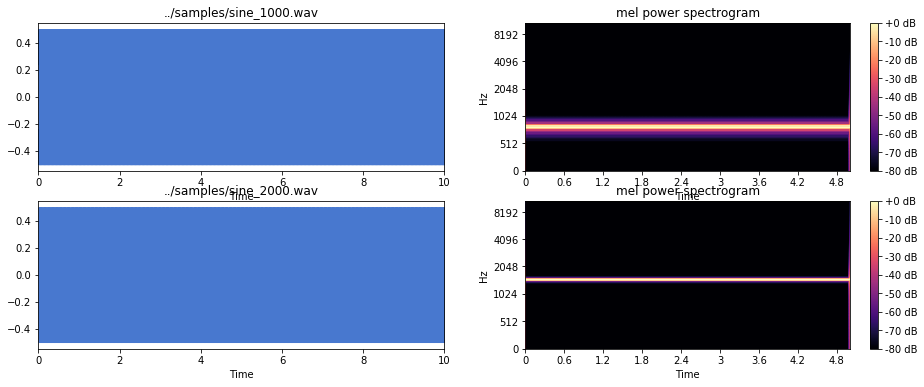

In [219]:
track1 = '../samples/sine_1000.wav'
track2 = '../samples/sine_2000.wav'
x1, sr = librosa.load(track1, sr = 44100, mono = 'True')
x2, sr = librosa.load(track2, sr = 44100, mono = 'True')

plt.figure(figsize=(16,6))
plt.subplot(2,2,1)
librosa.display.waveplot(x1)
plt.title(track1)

S1 = librosa.feature.melspectrogram(x1, sr=sr, n_mels=128)
log_S1 = librosa.power_to_db(S1, ref=np.max)
plt.subplot(2,2,2)
librosa.display.specshow(log_S1, sr=sr, x_axis='time', y_axis='mel')
plt.title('mel power spectrogram')
plt.colorbar(format='%+02.0f dB')

plt.subplot(2,2,3)
librosa.display.waveplot(x2)
plt.title(track2)

S2 = librosa.feature.melspectrogram(x2, sr=sr, n_mels=128)
log_S2 = librosa.power_to_db(S2, ref=np.max)
plt.subplot(2,2,4)
librosa.display.specshow(log_S2, sr=sr, x_axis='time', y_axis='mel')
plt.title('mel power spectrogram')
plt.colorbar(format='%+02.0f dB')


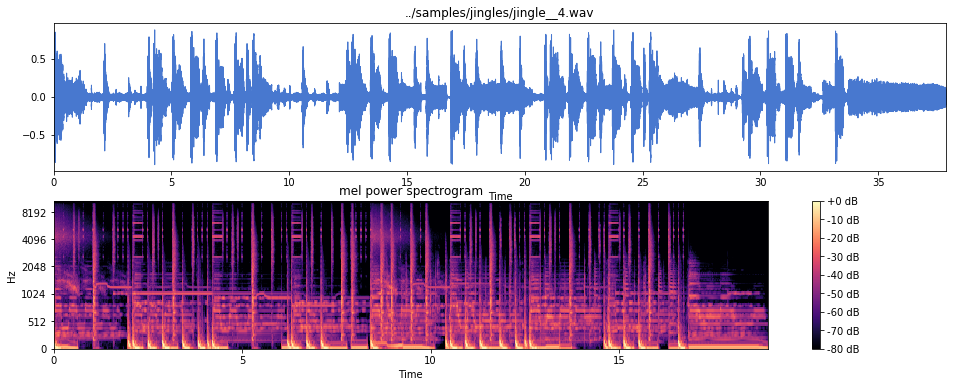

In [220]:
track = '../samples/jingles/jingle__4.wav'
x, sr = librosa.load(track, sr = 44100, mono = 'True')
plt.figure(figsize=(16,6))
plt.subplot(2,1,1)
librosa.display.waveplot(x)
plt.title(track)

S = librosa.feature.melspectrogram(x, sr=sr, n_mels=128)
log_S = librosa.power_to_db(S, ref=np.max)
plt.subplot(2,1,2)
librosa.display.specshow(log_S, sr=sr, x_axis='time', y_axis='mel')
plt.title('mel power spectrogram')
plt.colorbar(format='%+02.0f dB')

In [221]:
# initialising STFT params
N = 2 ** 15 #FFT size
M = N     #window size
H = N/16  #hop size
W = 'hann'

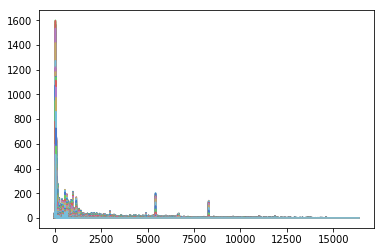

In [222]:
stft = librosa.stft(y = x, n_fft = N, hop_length = H, win_length = M, window = W, center = 'False')
mX = np.copy(stft)
np.shape(mX)
plt.figure()
plt.plot(np.abs(mX))
plt.show()


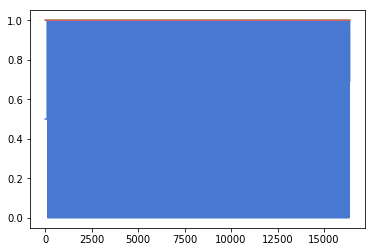

0.0981747704247


In [234]:
n = N/2 + 1
pan_order = n/32  #32 is best
alpha = np.pi/(n/pan_order)

start = 100
stop = n

l1_start = 1.0 #fix
l1_stop = 1.0

l2_start = 1.0
l2_stop = 1.0  #fix

wave = np.zeros(n)
bins = np.arange(0,n)
x_bins = np.arange(0,stop-start)
wave[start:stop] = np.sin((x_bins)*alpha)
line1 = ((bins-float(n))*(l1_stop-l1_start))/float(n)+l1_stop
line2 = ((bins-float(n))*(l2_stop-l2_start))/float(n)+l2_stop
pan_filter = (wave*line1*line2 + 1.0)/2.0
plt.figure()
plt.plot(bins,pan_filter)
plt.plot(line1)
plt.plot(line2)
plt.show()
print alpha

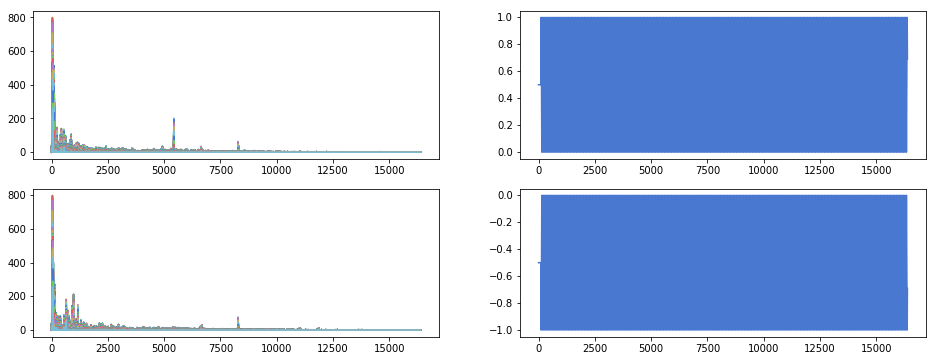

In [224]:
dc=2500
arr1=[]
arr2=[]
ons = np.zeros(dc)
ofs = np.ones(dc)
arr1 = np.append(ons,ofs)
arr2 = np.append(ofs,ons)
while ((np.size(arr1)<np.size(stft,axis=0)) and (np.size(arr2)<np.size(stft,axis=0))):
    arr1 = np.append(arr1,arr1)
    arr2 = np.append(arr2,arr2)
sq1 = arr1[0:np.size(stft,axis=0)]
sq2 = arr2[0:np.size(stft,axis=0)]

mY1 = np.copy(mX) #np.zeros(np.shape(mX))
mY1 = np.transpose(np.transpose(mY1) * np.matlib.repmat(pan_filter, np.size(stft,axis=1), 1))

plt.figure(figsize=(16,6))
plt.subplot(2,2,1)
plt.plot(np.abs(mY1))
plt.subplot(2,2,2)
plt.plot(pan_filter)

mY2 = np.copy(mX) #np.zeros(np.shape(mX))
mY2 = np.transpose(np.transpose(mY2) * np.matlib.repmat((-1.0*pan_filter)+1.0 , np.size(stft,axis=1), 1))
plt.subplot(2,2,3)
plt.plot(np.abs(mY2))
plt.subplot(2,2,4)
plt.plot(-1.0*pan_filter)
plt.show()


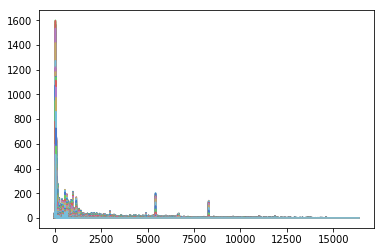

In [225]:
plt.figure()
plt.plot(np.abs(mX))
plt.show()

In [226]:
Y1 = librosa.istft(mY1, hop_length = H, win_length = M, window = W, center = 'False')
Y2 = librosa.istft(mY2, hop_length = H, win_length = M, window = W, center = 'False')

# Left channel

In [227]:
import IPython.display as ipd
ipd.Audio(Y1, rate=sr)

# Right channel

In [228]:
ipd.Audio(Y2, rate=sr)

# Synthesized stereo

In [229]:
ipd.Audio([Y1,Y2], rate=sr)

# Original

In [230]:
ipd.Audio(x, rate=sr)

In [ ]:
freq = librosa.fft_frequencies(sr=sr, n_fft=N)
print freq, np.shape(freq)

mels = librosa.mel_frequencies(n_mels=N/2, fmin=20.0, fmax=20000.0, htk=False)
print mels, np.shape(mels)